In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from scipy.stats import binom, beta

In [4]:
def count(domain, number):
    return sum(x == number for x in domain)

def beta_likelihood(theta, domain):
    N_1 = count(domain, 1)
    N_0 = len(domain) - N_1
    return binom.pmf(N_1, N_1+N_0, theta)
#     return (theta ** N_1) * (1 - theta) ** N_0

def likelihood(theta, n1, n0):
    return scipy.stats.binom.pmf(n1, n1+n0, theta)

def prior(a, b, theta):
    return ((theta ** (a-1)) * (1 - theta) ** (b-1))

def beta_prior(theta, a, b):
    return scipy.stats.beta.pdf(theta, a, b)

1.5


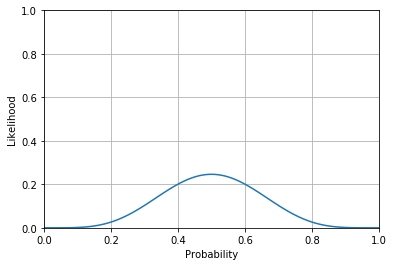

In [5]:
probabilities = np.arange(0, 1.1, 0.01)
domain = [1,1,1,1,1,0,0,0,0,0]

y = []
for theta in probabilities:
    y.append(beta_likelihood(theta, domain))

plt.xlabel('Probability')
plt.ylabel('Likelihood')
plt.ylim(0, 1)
plt.xlim(0, 1)
plt.plot(probabilities, y)
plt.grid()
plt.show()

In [6]:
prior = beta_prior(0.7, 2.975, 1.275)
print('Prior: %s' % prior)

Prior: 1.669154852628169


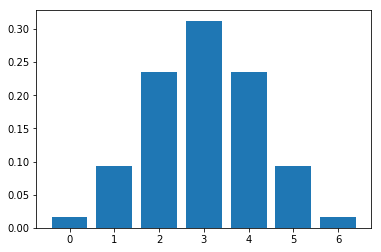

In [7]:
from scipy.stats import binom

n, p = 6, 0.5
x = np.arange(0, n+1, 1)
bino = binom(n, p)
plt.bar(x, bino.pmf(x))
plt.show()

In [8]:
from scipy.stats import bernoulli

p = 0.5
probabilities = []
# for _ in range(6):
#     probabilities.append(bernoulli(p))
for i in x:
    print(bernoulli(i).pmf())
bern = bernoulli(p)
bern.pmf(x)
    
# plt.bar(x, bern.pmf(x))

TypeError: pmf() missing 1 required positional argument: 'k'

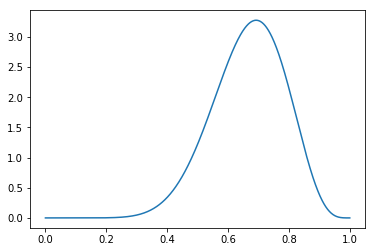

In [43]:
import numpy as np
import scipy.stats

def plot_prior(alpha, beta, ax=None):
    x = np.linspace(0, 1, 1000)
    y = scipy.stats.beta.pdf(x, alpha, beta)

    plt.plot(x, y)
    plt.show()
    
plot_prior(alpha=10, beta=5)

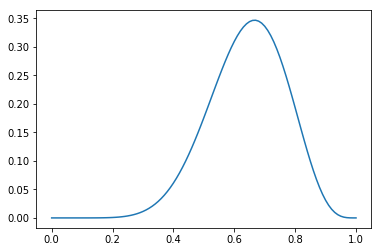

In [31]:
def posterior(theta, a, b, n1, n0):
    return likelihood(theta, n1, n0) * beta_prior(theta, a, b)

dim = np.arange(0.0, 1.1, 0.01)
n1 = 7
n0 = 3
alpha = 2
beta = 2
y = []
for index in dim:
    y.append(posterior(index, alpha, beta, n1, n0))
    
plt.plot(dim, y)

In [12]:
def posterior_predictive(n1, n0, a, b):
    return n1 + a / (n1 + a + n0 + b)

n1 = 7
n0 = 3
a = 2
b = 2

res = posterior_predictive(n1, n0, a, b)
print('Probability of heads: %0.2f%%' % (res*100/(n1+n0)))

Probability of heads: 71.43%


332


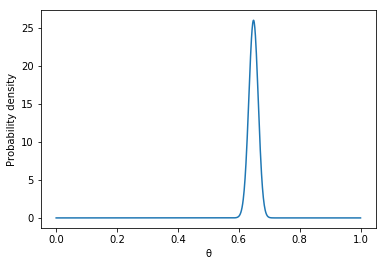

In [44]:
import scipy.stats
import pandas as pd
def coin_flip():
    return np.random.randint(0,2)

def batch_update_posterior(x, heads, tails, alpha, beta):
    return scipy.stats.beta.pdf(x, heads+alpha, tails+beta)

dataset = pd.read_csv('tictactoe.csv')

print(sum(x for x in dataset.Class == 0))

fig = plt.figure()
ax = fig.add_subplot(1,1,1)
heads = 0
tails = 0
x = np.linspace(0, 1, 1000)
alpha = 2
beta = 10

def animate(i):
    global tails
    global heads
#     coin = coin_flip()
    outcome = dataset.Class[i]
    if outcome == 1:
#     if coin == 1:
        heads += 1
    else:
        tails += 1
    
    y = batch_update_posterior(x, heads, tails, alpha, beta)
    ax.clear()
    ax.set_xlabel('θ')
    ax.set_ylabel('Probability density')
    ax.plot(x,y)

anim = animation.FuncAnimation(fig, animate, interval=100, frames=len(dataset))
HTML(anim.to_jshtml())